In [1]:
!pip install pmdarima
!pip install catboost
!pip install pandas_ta

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.1/115.1 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pandas_ta: filename=pandas_ta-0.3.14b0-py3-none-any.whl size=218908 sha256=bd7f935db620845eb38becbe124e50e6681f3107227c2cee817acf4201a89bb1
  Stored in directory: /root/.cache/pip/wheels/69/00/ac/f7fa862c34b0e2ef320175100c233377b4c558944f12474cf0
Successfully built pandas_ta


In [2]:
import pandas as pd
import numpy as np
from scipy import stats
from datetime import datetime
import time as time

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

import joblib

# ARIMA libraries
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller,kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

#Prophet Libraries
import prophet
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.plot import add_changepoints_to_plot

# ML Regression LIbrarires
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, Ridge,Lasso
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR

from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_val_score,cross_validate
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV


#LSTM Libraries
import tensorflow as tf
from keras.models import Sequential,load_model
from keras.layers import Dropout, Dense, LSTM, GRU
from keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler



In [3]:
df = pd.read_csv('/content/drive/MyDrive/Bahrain_Crypto_Omdean/DATA/HOURLY_Data/BTC_USDT_usable.csv',index_col=0,parse_dates=True)

In [97]:
df.head(5)

,open,high,low,close,base_volume,quote_volume,count,taker_base_volume,taker_quote_volume
2018-01-01 00:00:00,13715.65,13715.65,13400.01,13529.01,443.356199,5.993910e+06,5228.0,228.521921,3.090541e+06
2018-01-01 01:00:00,13528.99,13595.89,13155.38,13203.06,383.697006,5.154522e+06,4534.0,180.840403,2.430449e+06
2018-01-01 02:00:00,13203.00,13418.43,13200.00,13330.18,429.064572,5.710192e+06,4887.0,192.237935,2.558505e+06
2018-01-01 03:00:00,13330.26,13611.27,13290.00,13410.03,420.087030,5.657448e+06,4789.0,137.918407,1.858041e+06
2018-01-01 04:00:00,13434.98,13623.29,13322.15,13601.01,340.807329,4.588047e+06,4563.0,172.957635,2.328058e+06


In [17]:
df.isnull().sum()

open                  0
high                  0
low                   0
close                 0
base_volume           0
quote_volume          0
count                 0
taker_base_volume     0
taker_quote_volume    0
dtype: int64

In [ ]:
df.columns

Index(['open', 'high', 'low', 'close', 'base_volume', 'quote_volume', 'count',
       'taker_base_volume', 'taker_quote_volume'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 47785 entries, 2018-01-01 00:00:00 to 2023-06-15 00:00:00
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   open                47785 non-null  float64
 1   high                47785 non-null  float64
 2   low                 47785 non-null  float64
 3   close               47785 non-null  float64
 4   base_volume         47785 non-null  float64
 5   quote_volume        47785 non-null  float64
 6   count               47785 non-null  float64
 7   taker_base_volume   47785 non-null  float64
 8   taker_quote_volume  47785 non-null  float64
dtypes: float64(9)
memory usage: 3.6 MB


In [4]:
def separate_datetime_columns(df):
    df['Year'] = df.index.year
    df['Month'] = df.index.month
    df['Day'] = df.index.day
    df['Hour'] = df.index.hour


    return df

df = separate_datetime_columns(df)

# ARIMA



*   Seasonal Decomposition to check the data pattern



In [ ]:
df_btc_arima = df.copy()

In [ ]:
df_btc_arima = df_btc_arima.loc['2020':]

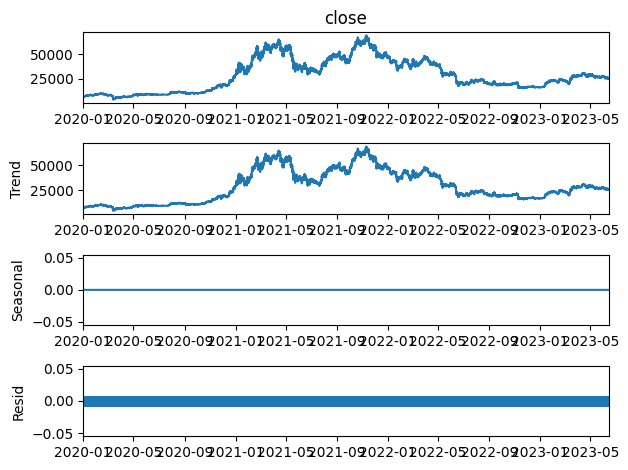

In [ ]:

decomposition = seasonal_decompose(df_btc_arima['close'], model='additive',period=1)
decomposition.plot()
plt.show()


As we can see, for hourly data, there is no seasonal pattern. We can go ahead with ARIMA




*   Lets check whether our trend is Stationary or no. We will use Augmented Dickey-Fuller (ADF) test and KPSS test.



In [ ]:
def adf_test(data):
    result = adfuller(data)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %.2e' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if result[1] < 0.05:
        print("Data is stationary")
    else:
        print("Data is not stationary")

def kpss_test(data):
    result = kpss(data)
    print('KPSS Statistic: %f' % result[0])
    print('p-value: %.2e' % result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print('\t%s: %.3f' % (key, value))

    if result[1] < 0.05:
        print("Data is not stationary")
    else:
        print("Data is stationary")

In [ ]:
adf_test(df_btc_arima['close'])

ADF Statistic: -1.618184
p-value: 4.74e-01
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Data is not stationary


In [ ]:
kpss_test(df_btc_arima['close'])

KPSS Statistic: 6.993028
p-value: 1.00e-02
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Data is not stationary


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Since both tests conclude that our data is not stationary, we will use DIFFERENCING,

<Axes: >

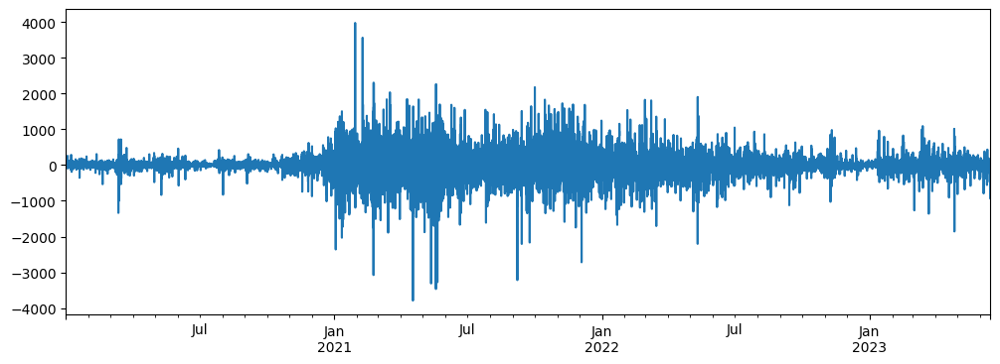

In [ ]:
df_btc_arima['diff'] = df_btc_arima['close'].diff()

df_btc_arima.dropna(subset=['diff'],inplace=True)

df_btc_arima['diff'].plot(figsize=(12,4))


The above plot looks pretty stationary, lets verify it with ADF test

In [ ]:
adf_test(df_btc_arima['diff'])

ADF Statistic: -25.877044
p-value: 0.00e+00
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Data is stationary


In [ ]:
kpss_test(df_btc_arima['diff'])

KPSS Statistic: 0.209757
p-value: 1.00e-01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Data is stationary


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Since the data is stationary now, we can proceed to plot ACF and PACF plots

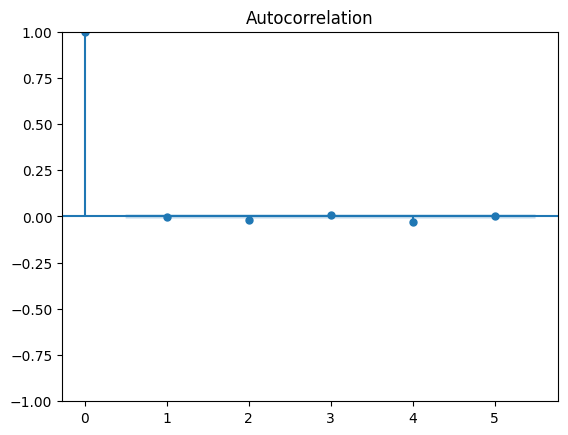

In [ ]:


plot_acf(df_btc_arima['diff'], lags=5)

plt.show()



/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


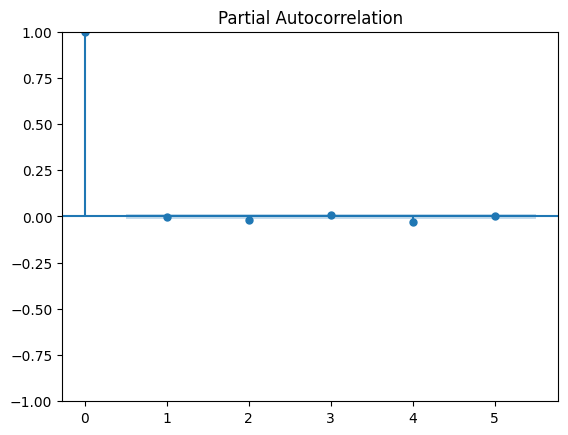

In [ ]:
plot_pacf(df_btc_arima['diff'], lags=5)
plt.show()



In [ ]:
price = df_btc_arima['close']


model = auto_arima(price, seasonal=False,start_p=0, max_p=5,start_q=0, max_q=5,trend='t')

print(model.order)

(0, 1, 0)


Auto-arima has calculated p = 0, d = 1 and q= 0. Let's fill in the ARIMA model and check the results

In [ ]:
# df_btc_model.reset_index(inplace=True,names=['Date'])

In [ ]:
split_date = '2022-06-01'


train = df_btc_arima.loc[df_btc_arima.index < split_date].copy()
test = df_btc_arima.loc[df_btc_arima.index >= split_date].copy()


In [ ]:
p = 0
d = 1
q = 0

In [ ]:
len(test['close'])

9097

In [ ]:
test_percent = len(test) / (len(train) + len(test)) * 100
print(f"The test set represents {test_percent:.2f}% of the total data.")


The test set represents 30.06% of the total data.


In [ ]:
history = [x for x in train['diff']]
predictions = list()
# walk-forward validation
for t in range(len(test)):
 model = ARIMA(history, order=(0,1,0))
 model_fit = model.fit()
 output = model_fit.forecast()
 test_forecast = output[0]
 predictions.append(test_forecast)
 obs = test['diff'][t]
 history.append(obs)


# evaluate forecasts
pred_df = pd.DataFrame({'Pred':predictions})
pred_df.index=test.index

rmse = np.sqrt(mean_squared_error(test['diff'],pred_df['Pred']))
print(" RMSE of ARIMA_010 : {:.2f}".format(rmse))

 RMSE of ARIMA_010 : 189.86


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                30263
Model:                 ARIMA(0, 1, 0)   Log Likelihood             -220960.065
Date:                Thu, 29 Jun 2023   AIC                         441922.130
Time:                        13:20:27   BIC                         441930.448
Sample:                             0   HQIC                        441924.798
                              - 30263                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.287e+05    362.860    354.678      0.000    1.28e+05    1.29e+05
===================================================================================
Ljung-Box (L1) (Q):                7342.92   Jarque-Bera (JB):            270708.32
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.58   Skew:                             0.43
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

---------------------Since our p,d,q avalues are 010, the model is a random walk model and is not suitable for forecasting.--------------------------------------

In [ ]:
# arima_score

,Unnamed: 0,RMSE,MAE,R2
0,ARIMA 010 Score,183.716,108.583,99.956


# Regression Models

DEFAULT MODEL FUNCTION

In [5]:
models = {
        'RandomForestRegressor': RandomForestRegressor(),
        'LinearRegression': LinearRegression(),
        'Ridge': Ridge(),
        'Lasso': Lasso(),
        'XGBRegressor': XGBRegressor(),
        'CatBoostRegressor' : CatBoostRegressor(verbose=False),
        'Gradient_Boosting' : GradientBoostingRegressor(),
        'Adaboost_Regressor' : AdaBoostRegressor(),
        'SVR' :  SVR()
    }




*   This is the Time Series split for cross validation across the dataset



In [6]:
class DefaultModelEvaluator:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.best_models = {}

    def evaluate_default_models(self, models):
      report = []

      # Create an instance of tscv with 5 splits
      tscv = TimeSeriesSplit(n_splits=5)

      for model_name, model in models.items():
          # Use cross_validate to get the RMSE and R2 scores of the model on each split

          start_time = time.time()

          results = cross_validate(model, self.X_train, self.y_train, cv=tscv, scoring=['neg_root_mean_squared_error', 'r2'], return_estimator=True)

          end_time = time.time()

          training_time = end_time - start_time

          # Get the fitted model from the last split
          model = results['estimator'][-1]

          y_train_pred = model.predict(self.X_train)
          y_test_pred = model.predict(self.X_test)


          train_model_score = r2_score(self.y_train, y_train_pred)
          test_model_score = r2_score(self.y_test, y_test_pred)


          RMSE = mean_squared_error(self.y_test, y_test_pred, squared=False)

          # Store the model and the mean RMSE score
          self.best_models[model_name] = (model, y_test_pred)

          report.append({
                        'Model_name': model_name,
                        'RMSE': RMSE,
                        'R2_test': test_model_score,
                        'R2_train': train_model_score,
                        'Time required' : training_time
                    })

      df_report_default = pd.DataFrame(report).sort_values(by='RMSE', ascending=True)

      return df_report_default

    def get_model(self, model_name):
        return self.best_models.get(model_name)



*  This function plots the train and test split across the number of split




In [7]:
def plot_splits(df, col,n_splits):
    tscv = TimeSeriesSplit(n_splits)
    column = df[col]
    fig, axes = plt.subplots(1, n_splits, figsize=(20, 4), sharey=True)

    for i, (train_index, test_index) in enumerate(tscv.split(column)):
        axes[i].plot(train_index, column.iloc[train_index], label=f'Train {i}')
        axes[i].plot(test_index, column.iloc[test_index], label=f'Test {i}')
        axes[i].legend()
        axes[i].set_title(f'Split {i}')

    plt.tight_layout()
    plt.show()


HYPEPARAMETERS

In [7]:
models_params= {


                "XGBRegressor":
                            {
                            'model_obj' : XGBRegressor(),
                            'params' :              {
                            #                              "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
                            #                               "max_depth"        : [1, 3, 4, 5, 6, 7,10,15],
                            #                               "n_estimators"     : [int(x) for x in np.linspace(start=100, stop=2000, num=10)],
                            #                               "min_child_weight" : [int(x) for x in np.arange(3, 15, 1)],
                            #                               "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                            #                               "subsample"        : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                            #                               "colsample_bytree" : [0.5, 0.6, 0.7, 0.8, 0.9, 1],
                            #                               "colsample_bylevel": [0.5, 0.6, 0.7, 0.8, 0.9, 1],

                            #                          },

                                                          'n_estimators': [250, 350],
                                                          'max_depth': [7,10,15],
                                                          'learning_rate': [0.15,0.2,0.25],


                            },
                            }
            }

GRID SEARCH CV

In [8]:

class ModelEvaluator_GS:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.best_models = {}

    def evaluate_models_GS_hypeparam(self, models_params):
        report = []

        # Create a TimeSeriesSplit object with 5 splits
        tscv = TimeSeriesSplit(n_splits=5)

        for model_name, m_p in models_params.items():
            model = m_p['model_obj']
            params = m_p['params']

            # Pass the TimeSeriesSplit object as the cv parameter
            gs = GridSearchCV(model, params, cv=tscv, scoring='neg_mean_squared_error')


            start_time = time.time()
            gs.fit(self.X_train, self.y_train)
            end_time = time.time()

            training_time = end_time - start_time

            best_model = gs.best_estimator_

            y_train_pred = best_model.predict(self.X_train)
            y_test_pred = best_model.predict(self.X_test)

            test_model_score = r2_score(self.y_test, y_test_pred)
            train_model_score = r2_score(self.y_train, y_train_pred)

            RMSE = mean_squared_error(self.y_test, y_test_pred, squared=False)

            report.append({
                'Model_name': model_name,
                'RMSE': RMSE,
                'RMSE_GS': np.sqrt(-gs.best_score_),
                'R2_test': test_model_score,
                'R2_train': train_model_score,
                'Best_Params': gs.best_params_,
                'Training_Time': training_time/60
            })

            self.best_models[model_name] = (best_model,y_test_pred)

        df_report_GS = pd.DataFrame(report).sort_values(by='RMSE',ascending=True)

        return df_report_GS

    def get_model(self, model_name):
        return self.best_models.get(model_name)


-------------------A FUNCTION TO PLOT MODEL RESULTS AND EXTRACT  PREDICTED DATA--------------------------------------------

In [7]:
def plot_model_results(model_name, evaluator, X_test,y_train, y_test,log_y=bool):


  model = evaluator.get_model(model_name)[0]
  y_test_pred = evaluator.get_model(model_name)[1]

  if log_y == True :
    y_test_pred = np.exp(y_test_pred)
    y_test = np.exp(y_test)
    y_train = np.exp(y_train)


  pred_series_test = pd.Series(y_test_pred, index=y_test.index)
  Train_Test_Pred = pd.DataFrame({'Y_train': y_train,
                                  'Y_test': y_test,
                                  model_name + '_pred_test': pred_series_test})


  Rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)


  fig = make_subplots()
  fig.add_trace(go.Scatter(x=Train_Test_Pred.index, y=Train_Test_Pred['Y_train'],
                          name='Y_train_close'), row=1, col=1)
  fig.add_trace(go.Scatter(x=Train_Test_Pred.index, y=Train_Test_Pred['Y_test'],
                          name='Y_test_close'), row=1, col=1)
  fig.add_trace(go.Scatter(x=Train_Test_Pred.index,
                          y=Train_Test_Pred[model_name + '_pred_test'],
                          name=model_name + '_predicted_test'), row=1, col=1)


  fig.update_layout(xaxis=dict(title='TimeFrame'), yaxis=dict(title='Close Price'),
                    title=f'Models Results : {model_name} | Test RMSE: {Rmse_test:.5f}')

  fig.show()
  return Train_Test_Pred



------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

###  TO CHECK SKEWNESS OF DATA

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

def transform_skewed_data(df):
    # Create a copy of the original DataFrame
    transformed_df = df.copy()

    # Perform logarithmic transformation
    for column in df.columns:
        transformed_df[column + '_log_transform'] = np.log(df[column] + 1)

    # Perform square root transformation
    for column in df.columns:
        transformed_df[column + '_sqrt_transform'] = np.sqrt(df[column])

    # Perform Box-Cox transformation
    for column in df.columns:
        transformed_df[column + '_boxcox_transform'], _ = stats.boxcox(df[column].values.flatten())

    # Plot histograms and QQ plots
    fig, axes = plt.subplots(nrows=len(df.columns), ncols=6, figsize=(18, 5 * len(df.columns)))
    fig.subplots_adjust(hspace=0.3)

    for i, column in enumerate(df.columns):
        # Plot histogram of original data
        axes[i, 0].hist(df[column], bins=30, density=True)
        axes[i, 0].set_title('Histogram - ' + column)
        axes[i, 0].set_xlabel(column)
        axes[i, 0].set_ylabel('Frequency')

        # Plot QQ plot of original data
        stats.probplot(df[column], dist="norm", plot=axes[i, 1])
        axes[i, 1].set_title('QQ Plot - ' + column)
        axes[i, 1].set_xlabel('Theoretical Quantiles')
        axes[i, 1].set_ylabel('Ordered Values')

        # Plot histogram of logarithmic transformed data
        axes[i, 2].hist(transformed_df[column + '_log_transform'], bins=30, density=True)
        axes[i, 2].set_title('Log ' + column)
        axes[i, 2].set_xlabel(column + ' (Log Transformed)')
        axes[i, 2].set_ylabel('Frequency')

        # Plot QQ plot of logarithmic transformed data
        stats.probplot(transformed_df[column + '_log_transform'], dist="norm", plot=axes[i, 3])
        axes[i, 3].set_title('QQ Plot - Log ' + column)
        axes[i, 3].set_xlabel('Theoretical Quantiles')
        axes[i, 3].set_ylabel('Ordered Values')

        # Plot histogram of Box-Cox transformed data
        axes[i, 4].hist(transformed_df[column + '_boxcox_transform'], bins=30, density=True)
        axes[i, 4].set_title('Box-Cox ' + column)
        axes[i, 4].set_xlabel(column + ' (Box-Cox Transformed)')
        axes[i, 4].set_ylabel('Frequency')

        # Plot QQ plot of Box-Cox transformed data
        stats.probplot(transformed_df[column + '_boxcox_transform'], dist="norm", plot=axes[i, 5])
        axes[i, 5].set_title('QQ Plot - Box-Cox ' + column)
        axes[i, 5].set_xlabel('Theoretical Quantiles')
        axes[i, 5].set_ylabel('Ordered Values')

    plt.tight_layout()
    plt.show()

    return transformed_df




*   As we can see below, log transformation removes the skewness to some extent



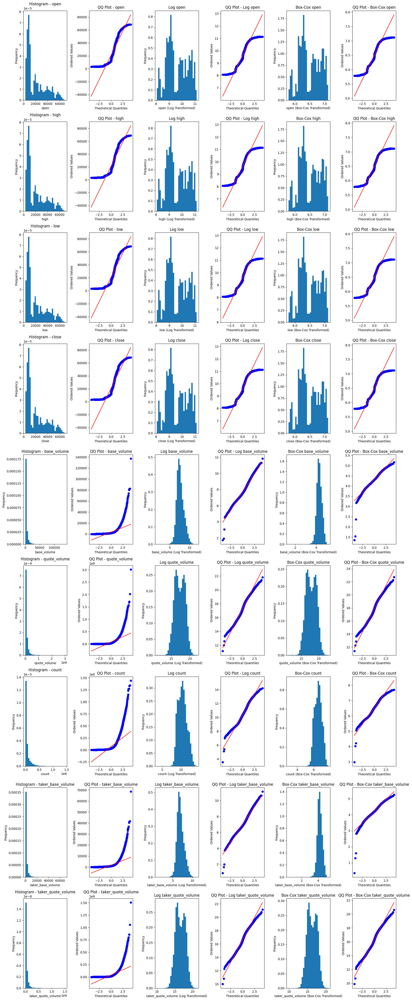

In [ ]:
transformed_plot = transform_skewed_data(df)

  ------------------------------------------------------------------------------------------------------------

### Time to scale the columns

In [92]:
df.head(4)

,open,high,low,close,base_volume,quote_volume,count,taker_base_volume,taker_quote_volume
2018-01-01 00:00:00,13715.65,13715.65,13400.01,13529.01,443.356199,5.993910e+06,5228.0,228.521921,3.090541e+06
2018-01-01 01:00:00,13528.99,13595.89,13155.38,13203.06,383.697006,5.154522e+06,4534.0,180.840403,2.430449e+06
2018-01-01 02:00:00,13203.00,13418.43,13200.00,13330.18,429.064572,5.710192e+06,4887.0,192.237935,2.558505e+06
2018-01-01 03:00:00,13330.26,13611.27,13290.00,13410.03,420.087030,5.657448e+06,4789.0,137.918407,1.858041e+06



*  Our target column would be 'close' column. So let's set our X and y accordingly


In [8]:

def split_and_scale(df, split_date, log=False, scaler=StandardScaler()):
    # Apply log transformation if log is True
    if log:
        df = np.log1p(df)

    # Split the data into train and test sets
    train = df.loc[df.index <= split_date].copy()
    test = df.loc[df.index > split_date].copy()

    # Separate the input features and the target variable
    X_train, y_train = train.drop(['close'], axis=1), train[['close']]
    X_test, y_test = test.drop(['close'], axis=1), test[['close']]

    # Get the column names of the input features
    columns = X_train.columns.tolist()

    # Scale the input features using the scaler
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train[columns]), columns=columns)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test[columns]), columns=columns)

    X_train_scaled.set_index(X_train.index, inplace=True)
    X_test_scaled.set_index(X_test.index, inplace=True)

    # Return the scaled input features and the target variable
    return X_train_scaled, X_test_scaled, y_train, y_test


In [103]:
X_train_scaled, X_test_scaled, y_train, y_test = split_and_scale(df,'2023-01-01',log=True)

 ### THIS IS HOW, TIMESERIES SPLIT WILL HAPPEN

*   The output RMSE and R2 score is the mean of all splits, 5 splits here



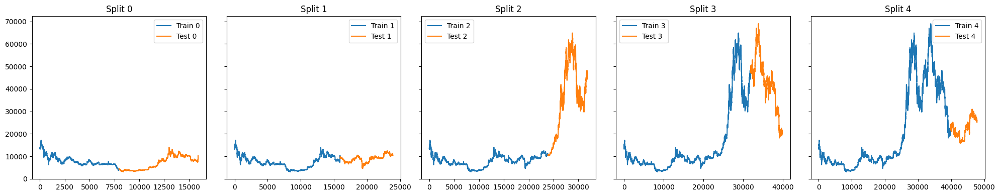

In [70]:
plot_splits(df,'high',5)



________________________________________________________________________________________________________________________________________________________________



## Default Models



---------------------- LOG TRANSFORMED INPUT FEATURES

In [104]:
# Log true

default_eval_log = DefaultModelEvaluator(X_train_scaled,y_train['close'],X_test_scaled,y_test['close'])

report_default_log = default_eval_log.evaluate_default_models(models)

* The RMSE mean values here are when y_test was log transformed

In [105]:
report_default_log

,Model_name,RMSE,R2_test,R2_train,Time required
1,LinearRegression,0.002061,0.999811,0.999982,0.232212
2,Ridge,0.002361,0.999752,0.999977,0.167740
0,RandomForestRegressor,0.004415,0.999133,0.999989,96.114805
6,Gradient_Boosting,0.013529,0.991860,0.999917,37.782250
4,XGBRegressor,0.016514,0.987872,0.999919,20.418850
7,Adaboost_Regressor,0.040465,0.927186,0.997342,16.919940
8,SVR,0.049371,0.891604,0.997341,1.607885
5,CatBoostRegressor,0.128049,0.270858,0.996012,24.152222
3,Lasso,0.662833,-18.537529,-0.015813,0.179205


In [106]:
data_def_log = plot_model_results('XGBRegressor',default_eval_log, X_test_scaled,y_train['close'], y_test['close'],log_y=True)

  **After log transformed XGBRegressor RMSE is : 432.03**

-------------- NO LOG APPLIED TO THE INPUT

In [72]:
# No log transform

default_eval_nolog = DefaultModelEvaluator(X_train_scaled,y_train['close'],X_test_scaled,y_test['close'])

report_default_no_log = default_eval_nolog.evaluate_default_models(models)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.194e+06, tolerance: 3.225e+06

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.886e+07, tolerance: 1.042e+07

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.472e+07, tolerance: 1.218e+07



In [73]:
report_default_no_log

,Model_name,RMSE,R2_test,R2_train,Time required
1,LinearRegression,58.378156,0.999721,0.999967,0.176250
2,Ridge,80.145604,0.999474,0.999961,0.101640
3,Lasso,91.448335,0.999316,0.999886,0.718355
0,RandomForestRegressor,117.683997,0.998867,0.999985,93.420946
4,XGBRegressor,303.649913,0.992455,0.999943,18.901280
6,Gradient_Boosting,310.586856,0.992106,0.999909,38.358141
7,Adaboost_Regressor,1039.017487,0.911659,0.997122,15.697830
5,CatBoostRegressor,1922.683877,0.697495,0.995017,23.768123
8,SVR,10752.748900,-8.461399,0.108054,151.391656


In [74]:
data_def_nolog = plot_model_results('XGBRegressor',default_eval_nolog, X_test_scaled,y_train['close'], y_test['close'],log_y=False)

###------------------  AS WE CAN SEE ABOVE LOG TRANSFORMING DOES NOT HELP THE RESULTS MUCH -----------------------

In [10]:
df.columns

Index(['open', 'high', 'low', 'close', 'base_volume', 'quote_volume', 'count',
       'taker_base_volume', 'taker_quote_volume', 'Year', 'Month', 'Day',
       'Hour'],
      dtype='object')

<Axes: >

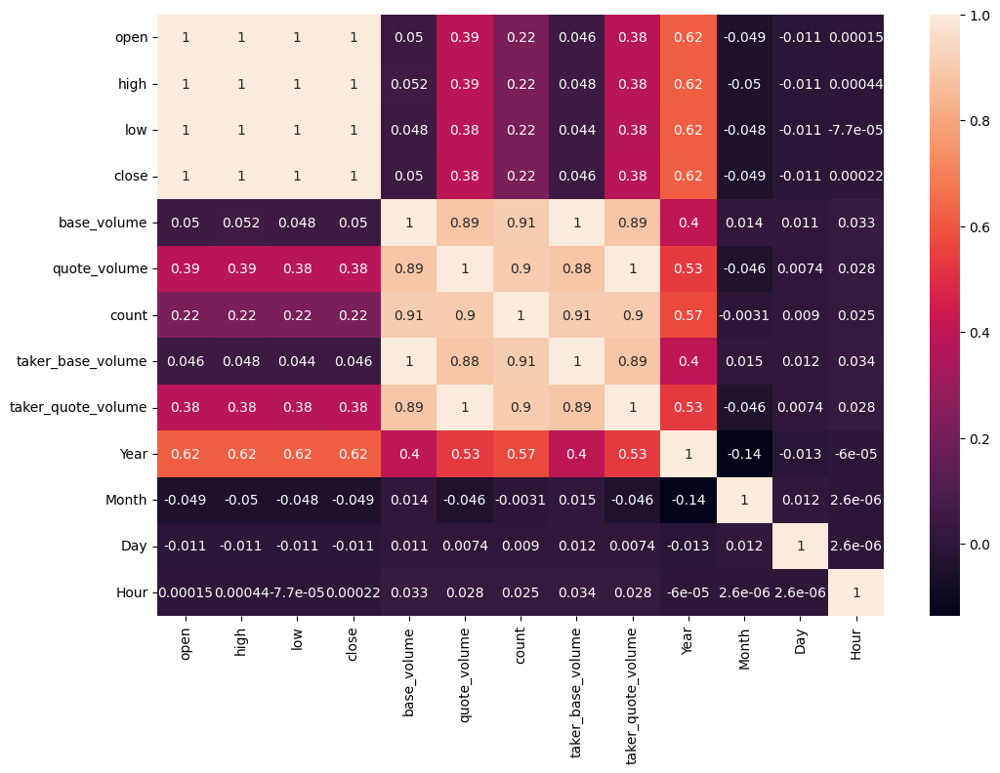

In [12]:
fig = plt.figure(figsize=(12,8))
sns.heatmap(df.corr(),annot=True)

INFERENCES
  * As we can see open,high,low and close are highly correlated to each other.
  * All the volume columns too are highly correlated to each other.
  *  Year column has positive correlated of 0.62 with OHLC columns and 0.4-0.53 with volume columns.
  * Quote volume and taker quote volume have moderate positive (0.38) correlation with the OHLC columns where as base volume and taker base volume do not have that much correlation with OHLC columns.
  * Year and volume features show positive correlation of 0.4-0.57.
  

## LETS ADD TECHNICAL INDICATORS AND CHECK MODEL PERFORMANCE

The below function calculates RSI,ATR, Bollinger Bands, EMa and Simple returns for the dataset and period. THe respective columns are added to the input dataframe

In [9]:

import pandas_ta as ta

def calculate_indicators(df, period):
    # Calculate RSI
    df['RSI_{}'.format(period)] = ta.rsi(df['close'], length=period)

    # Calculate ATR
    df['ATR_{}'.format(period)] = ta.atr(df['high'], df['low'], df['close'], length=period)

    # Calculate Bollinger Bands
    bb = ta.bbands(df['close'], length=period)
    df['BB_UPPER_{}'.format(period)] = bb['BBU_{}_2.0'.format(period)]
    df['BB_LOWER_{}'.format(period)] = bb['BBL_{}_2.0'.format(period)]
    df['BB_MID_{}'.format(period)] = bb['BBM_{}_2.0'.format(period)]

    # Calculate Bollinger Bandwidth
    df['BB_WIDTH_{}'.format(period)] = (df['BB_UPPER_{}'.format(period)] - df['BB_LOWER_{}'.format(period)]) / df['BB_MID_{}'.format(period)]

    # Calculate EMA
    df['EMA_{}'.format(period)] = ta.ema(df['close'], length=period)

    # Calculate simple returns
    df['RETURNS'] = df['close'].pct_change(periods=1)

    df.dropna(axis=0,inplace=True)

    return df


In [51]:
df1=df.copy()

In [52]:
df1 = calculate_indicators(df1,6)

In [53]:
df1.columns

Index(['open', 'high', 'low', 'close', 'base_volume', 'quote_volume', 'count',
       'taker_base_volume', 'taker_quote_volume', 'Year', 'Month', 'Day',
       'Hour', 'RSI_6', 'ATR_6', 'BB_UPPER_6', 'BB_LOWER_6', 'BB_MID_6',
       'BB_WIDTH_6', 'EMA_6', 'RETURNS'],
      dtype='object')

In [13]:
df1.head()

,open,high,low,close,base_volume,quote_volume,count,taker_base_volume,taker_quote_volume,Year,...,Day,Hour,RSI_6,ATR_6,BB_UPPER_6,BB_LOWER_6,BB_MID_6,BB_WIDTH_6,EMA_6,RETURNS
2018-01-01 06:00:00,13539.00,13800.00,13510.00,13780.41,264.989684,3.613408e+06,4072.0,126.077500,1.718753e+06,2018,...,1,6,73.547268,278.444692,13859.351896,13101.874771,13480.613333,0.056190,13536.340952,0.016330
2018-01-01 07:00:00,13780.00,13818.55,13555.02,13570.35,292.188777,4.002026e+06,4340.0,147.150029,2.016275e+06,2018,...,1,7,52.471345,274.996615,13828.995540,13254.661126,13541.828333,0.042412,13546.057823,-0.015243
2018-01-01 08:00:00,13569.98,13735.24,13400.00,13499.99,271.813553,3.681944e+06,3733.0,122.809696,1.664737e+06,2018,...,1,8,47.051832,288.079943,13794.995931,13345.264069,13570.130000,0.033141,13532.895588,-0.005185
2018-01-01 09:00:00,13499.97,13670.00,13459.11,13616.99,213.095829,2.893105e+06,3128.0,96.470199,1.309921e+06,2018,...,1,9,56.099710,272.122244,13778.351358,13430.895309,13604.623333,0.025540,13556.922563,0.008667
2018-01-01 10:00:00,13632.00,13657.92,13497.98,13570.01,169.512196,2.298369e+06,2769.0,68.490957,9.285741e+05,2018,...,1,10,51.831934,249.823895,13775.140094,13423.773240,13599.456667,0.025837,13560.661831,-0.003450


In [81]:
X_train_indi_scaled,X_test_indi_scaled,y_train_indi,y_test_indi = split_and_scale(df1,'2023-01-01',log=False)

In [82]:
default_indi_evaluator = DefaultModelEvaluator(X_train_indi_scaled,y_train_indi['close'],X_test_indi_scaled,y_test_indi['close'])
report_default_indi = default_indi_evaluator.evaluate_default_models(models)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.234e+06, tolerance: 3.210e+06



--------------------- Period 6h

In [83]:
# USing period 6
report_default_indi

,Model_name,RMSE,R2_test,R2_train,Time required
3,Lasso,30.035604,0.999926,0.999940,0.531446
2,Ridge,34.171687,0.999904,0.999978,0.104245
1,LinearRegression,57.855929,0.999726,0.999981,0.268598
0,RandomForestRegressor,129.729759,0.998623,0.999985,159.909410
4,XGBRegressor,300.964492,0.992588,0.999949,45.889999
6,Gradient_Boosting,346.848509,0.990155,0.999914,72.540605
7,Adaboost_Regressor,1208.871409,0.880415,0.997211,28.787503
5,CatBoostRegressor,1736.685326,0.753192,0.999553,35.858821
8,SVR,10485.884319,-7.997596,0.148976,162.428504


--------------------------------- Period 12

In [57]:
# Using period as 12
report_default_indi


,Model_name,RMSE,R2_test,R2_train,Time required
3,Lasso,30.133843,0.999926,0.999941,0.501697
2,Ridge,38.763549,0.999877,0.999977,0.101269
1,LinearRegression,47.816683,0.999813,0.999978,0.235669
0,RandomForestRegressor,180.086478,0.997346,0.999966,155.940816
4,XGBRegressor,378.150505,0.988298,0.999930,30.345873
6,Gradient_Boosting,572.759138,0.973155,0.999858,69.705065
5,CatBoostRegressor,1121.924854,0.896998,0.999716,34.511396
7,Adaboost_Regressor,1174.208245,0.887175,0.997071,27.806807
8,SVR,10550.031840,-8.108018,0.145670,155.438729


------------------------ Period 24

In [44]:
# Using period as 24
report_default_indi

,Model_name,RMSE,R2_test,R2_train,Time required
3,Lasso,30.158414,0.999926,0.999941,0.300916
2,Ridge,43.541214,0.999845,0.999976,0.103084
1,LinearRegression,43.994726,0.999842,0.999977,0.134827
0,RandomForestRegressor,204.369939,0.996582,0.999963,152.933148
4,XGBRegressor,383.032554,0.987994,0.999926,32.536766
6,Gradient_Boosting,630.706265,0.967449,0.999836,70.978047
5,CatBoostRegressor,1185.876818,0.884921,0.999725,31.298589
7,Adaboost_Regressor,1186.236528,0.884851,0.996943,27.880028
8,SVR,10576.028171,-8.152960,0.145190,157.425249


INFERENCES :  
        
        *  RMSE and R2 test decrease with increase in period for all models


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

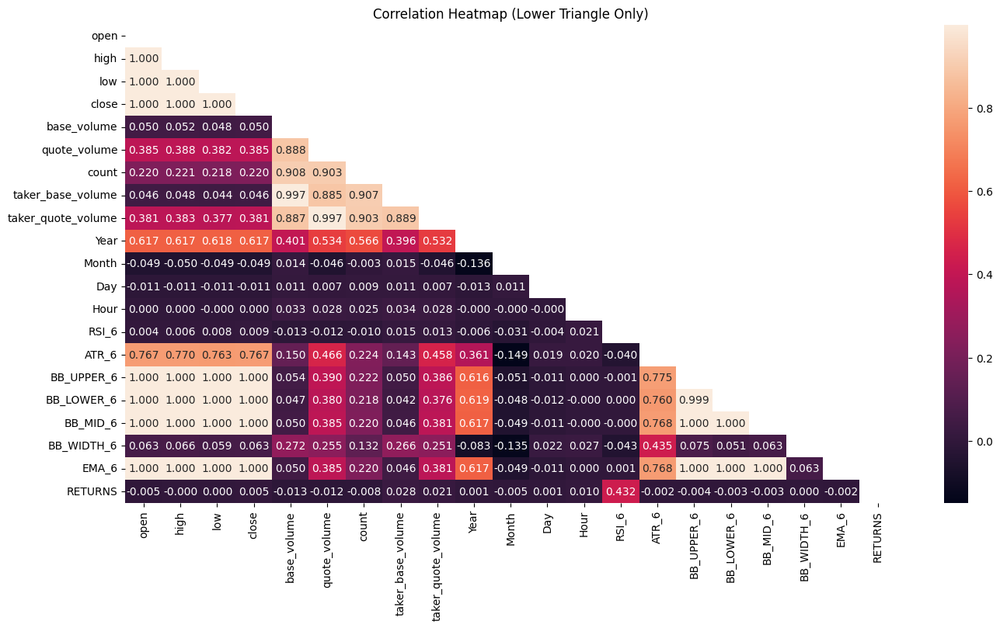

In [34]:
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))

# Plot the correlation heatmap with the masked triangle
plt.figure(figsize=(16, 8))
sns.heatmap(df1.corr(), mask=mask, annot=True, fmt=".3f")
plt.title('Correlation Heatmap (Lower Triangle Only)')
plt.show()

INFERENCES :

  * RSI_6 has no great correlation to any other features.
  * ATR_6 has positive (0.77) corr with OHLC, moderate positive (0.4) with quote_volume and (0.361) with Year with a slight negative corr (-0.149) with Month.
  * Bollinger bands have high corr with OHLC, moderate positive with quote volume, pretty good positive corr with Year. Where as the bandwidth has decent positive corr with ATR and low positive with volumes.
  * EMA_6 has high corr with OHLC, positive corr with Year and ATR_6
  * Returns have decent positive corr with RSI_6.


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Feature Selection

In [31]:
from sklearn.feature_selection import f_regression, mutual_info_regression, SelectKBest
from sklearn.ensemble import RandomForestRegressor


def feature_selection(df, target, k):

    X = df.drop(target, axis=1)
    y = df[target]


    techniques = {f_regression: 'f_regression', mutual_info_regression: 'mutual info regression', RandomForestRegressor: 'random forest feature selection'}
    scores = {}

    for technique, name in techniques.items():

        if name == 'random forest feature selection':

            selector = technique(n_estimators=300, random_state=42)
            selector.fit(X, y)
            score = selector.feature_importances_
        else:

            selector = SelectKBest(score_func=technique, k=k)
            selector.fit(X, y)
            score = selector.scores_
        scores[name] = pd.DataFrame(score, index=X.columns)

    fig, axes = plt.subplots(1, 3, figsize=(18, 9))
    for i, (name, score) in enumerate(scores.items()):
        score.sort_values(by=0, ascending=False, inplace=True)
        sns.barplot(x=0, y=score.index[:k], data=score[:k], ax=axes[i])
        axes[i].set_title(f'Top {k} features by {name}')
        axes[i].set_xlabel('Score')
        axes[i].set_ylabel('Feature')


    plt.tight_layout()
    plt.show()



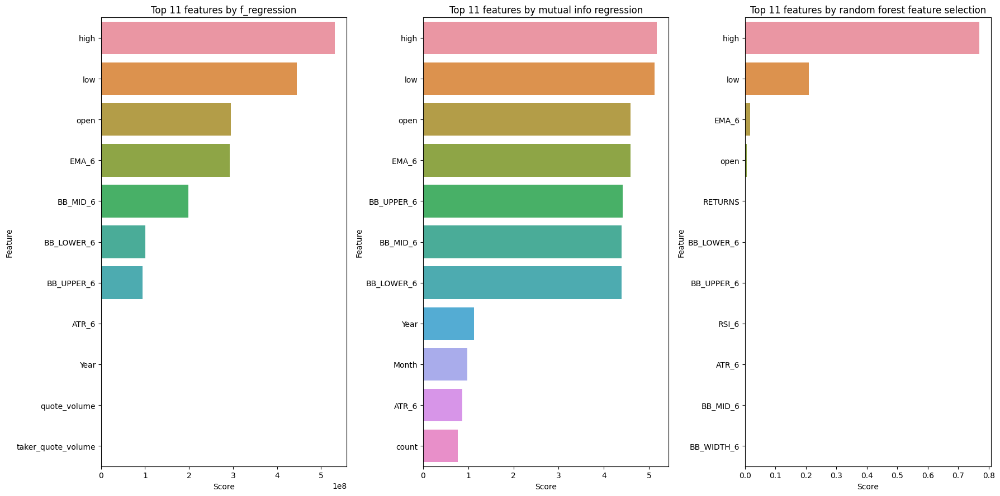

In [32]:
feature_selection(df1,'close',11)

Inferences :

* As we can see that, OHL, EMA and Bollinger upper, lower and middle columns have more importance and that is obvious because they all are highly correlated to the target column and each other.


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Let's Drop highly correlated features and then see how the model's perform


  *   We will keep EMA and quote_volume amongst the highly correlated columns




In [65]:
df2 = df1.copy()

In [56]:
df2.columns

Index(['open', 'high', 'low', 'close', 'base_volume', 'quote_volume', 'count',
       'taker_base_volume', 'taker_quote_volume', 'Year', 'Month', 'Day',
       'Hour', 'RSI_6', 'ATR_6', 'BB_UPPER_6', 'BB_LOWER_6', 'BB_MID_6',
       'BB_WIDTH_6', 'EMA_6', 'RETURNS'],
      dtype='object')

In [66]:
df2 = df1.drop(['open','high','low','BB_UPPER_6', 'BB_LOWER_6', 'BB_MID_6','count','taker_base_volume', 'taker_quote_volume','base_volume','EMA_6'],axis=1)

In [68]:
X_train,X_test,y_train,y_test = split_and_scale(df2,'2023-01-01',log=False)

In [69]:
default_indi_evaluator_dropped = DefaultModelEvaluator(X_train,y_train['close'],X_test,y_test['close'])
reports_indi_def_drop = default_indi_evaluator_dropped.evaluate_default_models(models)

In [64]:
reports_indi_def_drop

,Model_name,RMSE,R2_test,R2_train,Time required
3,Lasso,99.660483,0.999187,0.999919,0.143044
2,Ridge,107.158222,0.999060,0.999918,0.106740
1,LinearRegression,107.445542,0.999055,0.999918,0.285269
0,RandomForestRegressor,215.018923,0.996217,0.999965,102.214411
4,XGBRegressor,255.047704,0.994677,0.999938,22.507111
6,Gradient_Boosting,393.404172,0.987335,0.999918,36.585664
7,Adaboost_Regressor,1079.974301,0.904557,0.996798,14.376407
5,CatBoostRegressor,2253.000266,0.584626,0.992474,30.876490
8,SVR,12655.652536,-12.106461,-0.060236,220.150031


In [70]:
# WIthout EMA_6
reports_indi_def_drop

,Model_name,RMSE,R2_test,R2_train,Time required
1,LinearRegression,9585.342263,-6.518507,0.760421,0.160382
2,Ridge,9586.211213,-6.519870,0.760411,0.115410
3,Lasso,9592.593634,-6.529887,0.760348,0.174915
8,SVR,13443.444500,-13.788954,-0.155985,214.402911
5,CatBoostRegressor,15436.534913,-18.499164,0.818772,28.653348
0,RandomForestRegressor,18828.577384,-28.010243,0.627667,101.680445
6,Gradient_Boosting,19973.568550,-31.645827,0.693639,31.782017
4,XGBRegressor,20045.717941,-31.882102,0.649944,21.605829
7,Adaboost_Regressor,20196.031944,-32.377088,0.584428,8.602439


INFERENCES :


*   As we can see, after removing EMA which was the only column perfectly corrrelated to target, the RMSE and R2 score becomes worse.

